# Building Wine Classifier Model with PyCaret

In [ ]:
!pip install pycaret --q

     |████████████████████████████████| 264 kB 2.7 MB/s 
     |████████████████████████████████| 111 kB 58.1 MB/s 
     |████████████████████████████████| 14.6 MB 114 kB/s 
     |████████████████████████████████| 6.8 MB 44.8 MB/s 
     |████████████████████████████████| 271 kB 63.4 MB/s 
     |████████████████████████████████| 2.0 MB 41.2 MB/s 
     |████████████████████████████████| 56 kB 4.1 MB/s 
     |████████████████████████████████| 248 kB 72.9 MB/s 
     |████████████████████████████████| 80 kB 7.4 MB/s 
     |████████████████████████████████| 167 kB 48.3 MB/s 
     |████████████████████████████████| 1.7 MB 54.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 1.3 MB 55.4 MB/s 
     |████████████████████████████████| 3.1 MB 61.3 MB/s 
     |████████████████████████████████| 62 kB 772 kB/s 
     |████████████████████

In [ ]:
!pip install AutoViz -q

     |████████████████████████████████| 44 kB 873 kB/s 


In [ ]:
!pip install pandas-profiling==2.8.0  -q

     |████████████████████████████████| 259 kB 2.6 MB/s 
     |████████████████████████████████| 59 kB 5.7 MB/s 


In [ ]:
import pycaret
import pandas as pd
import numpy as np
import pandas_profiling
import seaborn as sns
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


In [ ]:
pycaret.__version__


'2.3.3'

In [ ]:
pandas_profiling.__version__

'2.8.0'

In [ ]:
wine_df = pd.read_csv('/content/winequality-red.csv')

In [ ]:
wine_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [ ]:
wine_df.shape


(1599, 12)

In [ ]:
from autoviz.AutoViz_Class import AutoViz_Class

AV = AutoViz_Class()

Imported AutoViz_Class version: 0.0.84. Call using:
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not show plot but creates them and saves them in AutoViz_Plots directory in your local machine.


Shape of your Data Set loaded: (1599, 12)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  11
    Number of Integer-Categorical Columns =  1
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    12 Predictors classified...
        This does not include the Target column(s)
        No variables removed since no ID or low-information variables found in data set
Data Set Shape: 1599 rows, 12 cols
Data Set columns info:
* fixed acidity: 0 nulls, 96 unique vals, most common: {7.2: 67, 7.1: 57}
* volatile acidity: 0 nulls, 143 unique vals, most common: {0.6: 47, 0.5: 46}
* citric acid: 0 

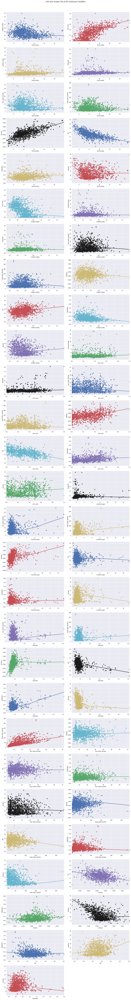

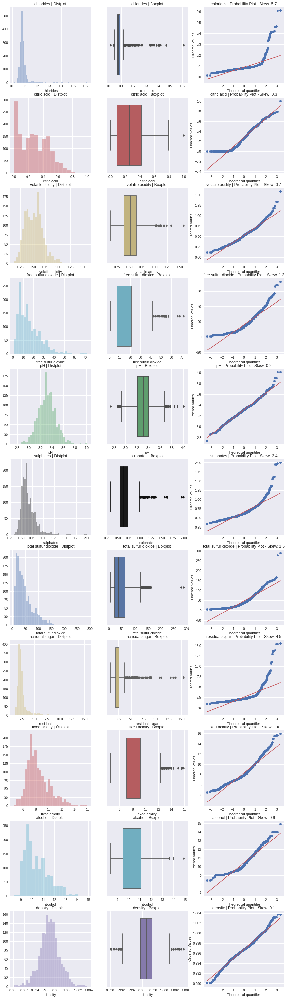

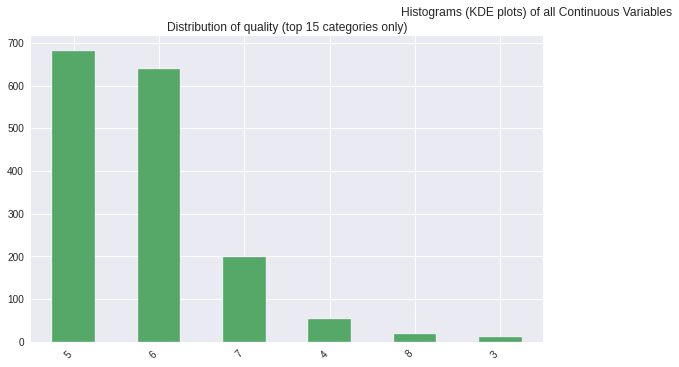

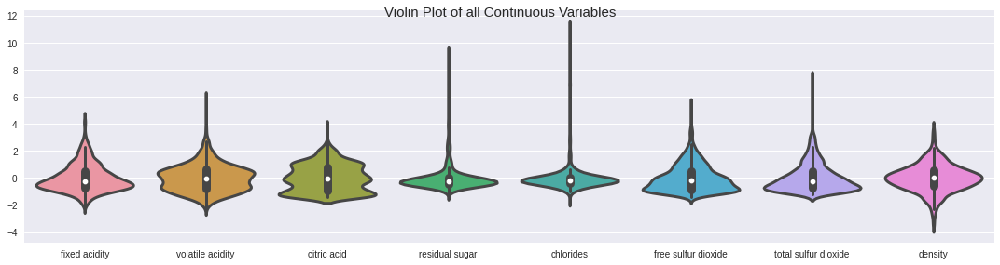

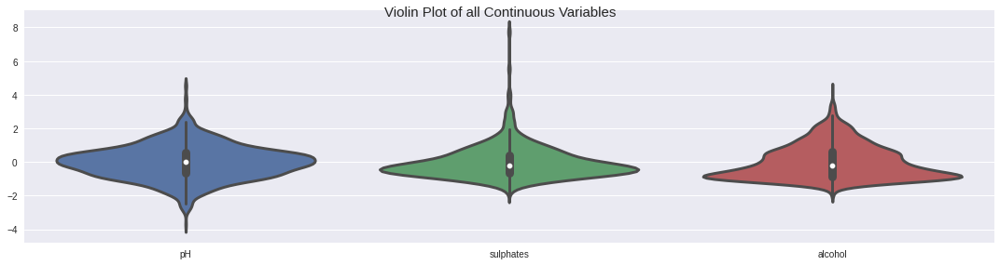

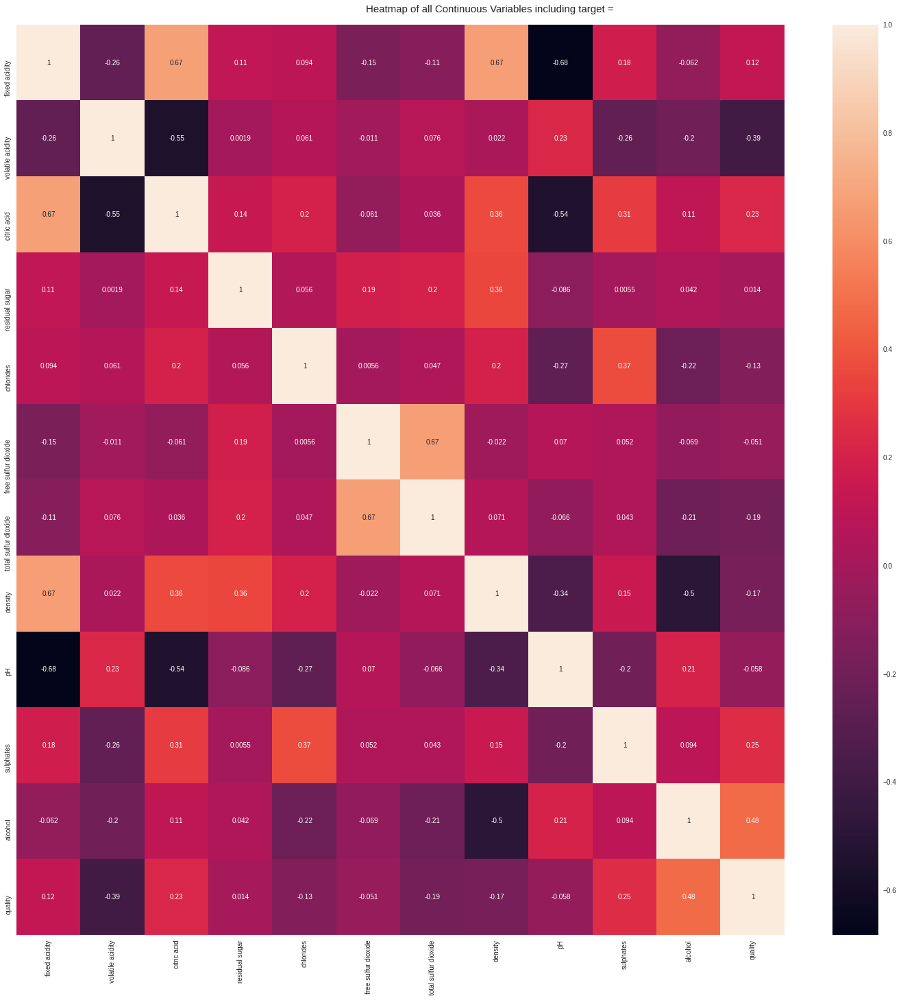

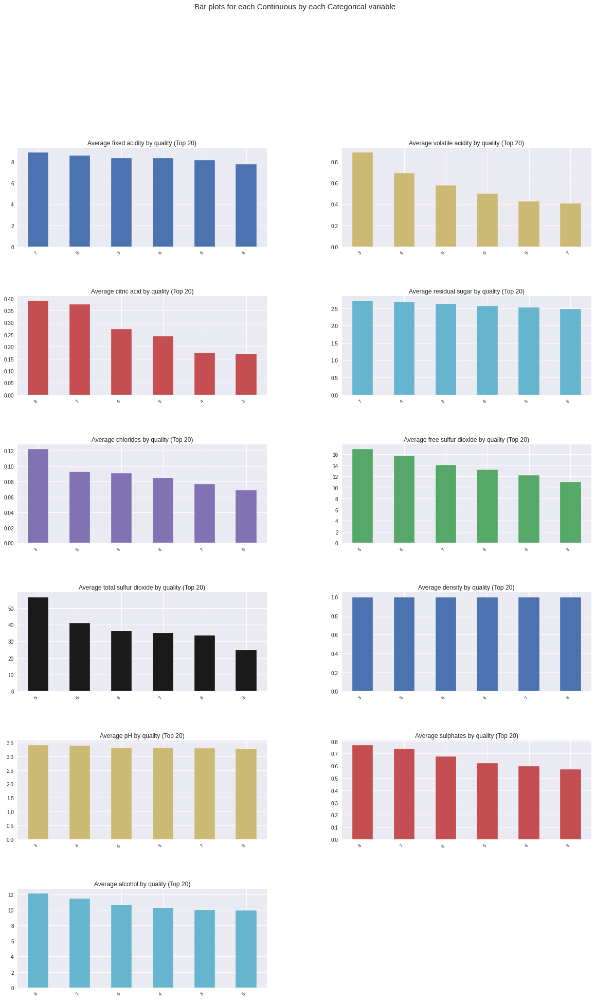

Time to run AutoViz (in seconds) = 36.078

 ###################### VISUALIZATION Completed ########################


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [ ]:
AV.AutoViz(filename="", sep=',', depVar='', dfte=wine_df, header=0, verbose=1,
                            lowess=True)

Shape of your Data Set loaded: (1599, 12)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  11
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    11 Predictors classified...
        This does not include the Target column(s)
        No variables removed since no ID or low-information variables found in data set

################ Multi_Classification VISUALIZATION Started #####################
Using Lowess Smoothing. This might take a few minutes for large data sets...


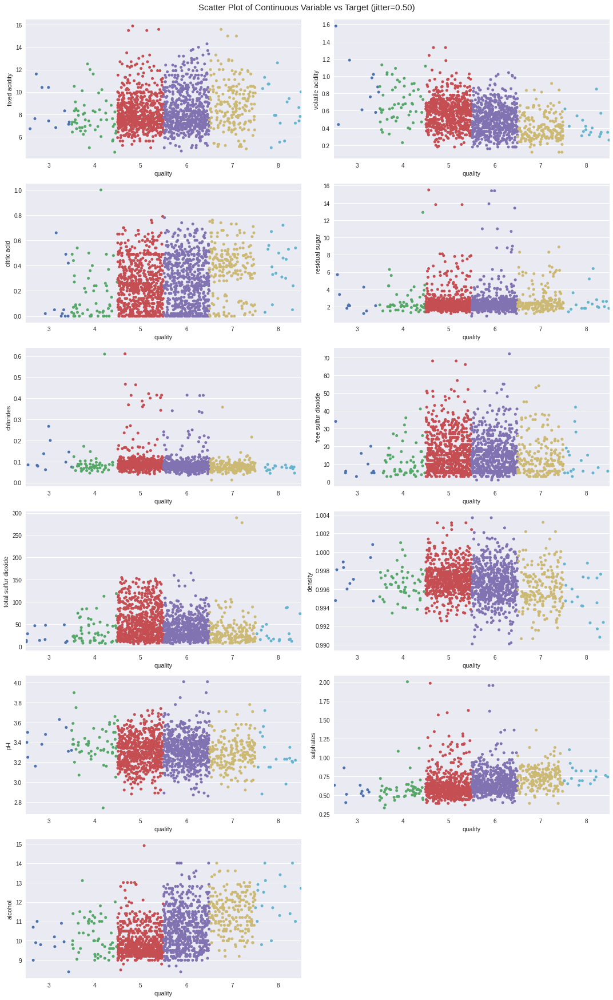

Using Lowess Smoothing. This might take a few minutes for large data sets...
Total Number of Scatter Plots = 66


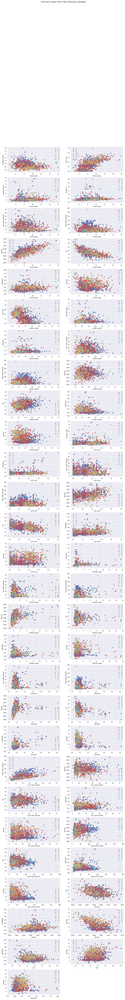

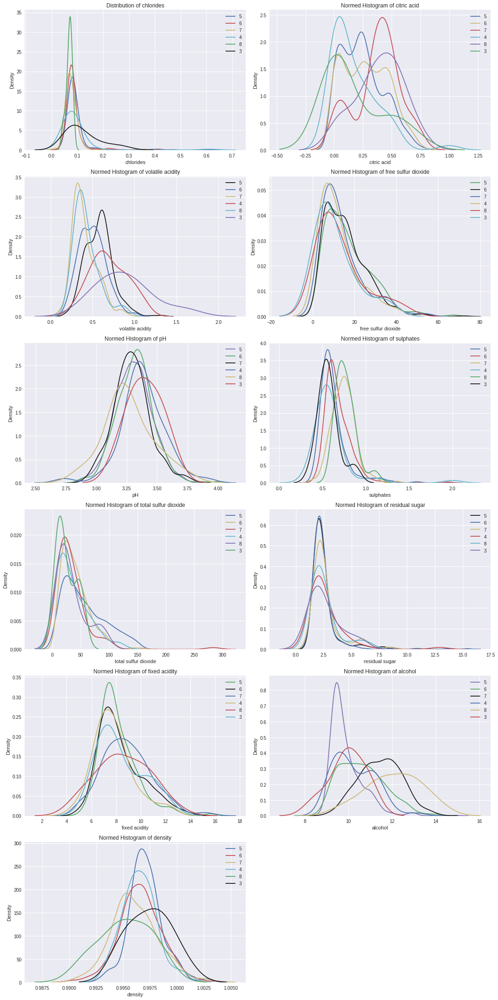

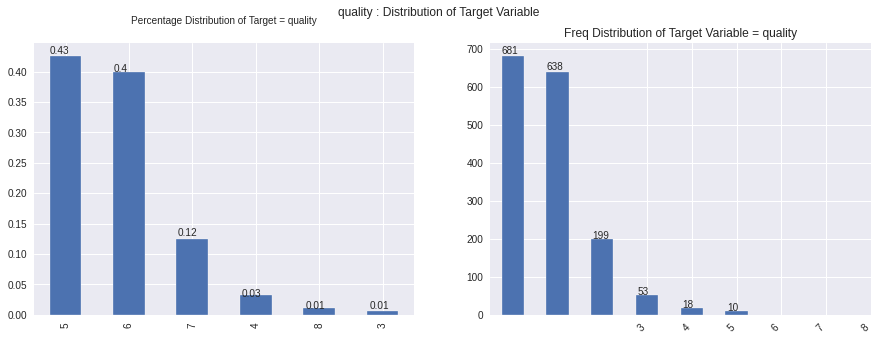

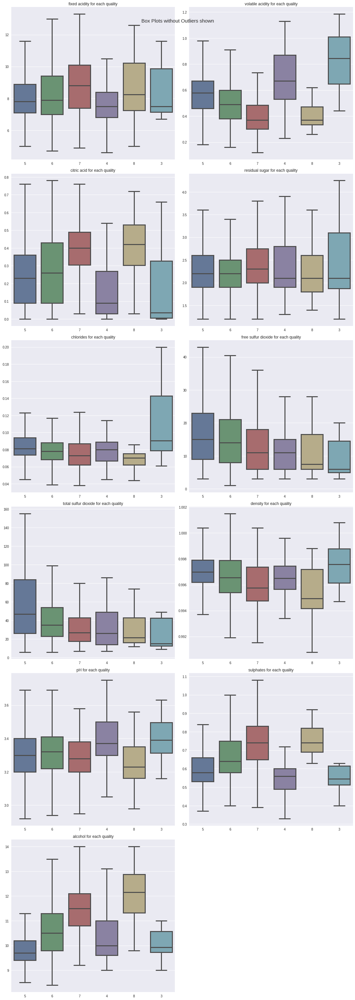

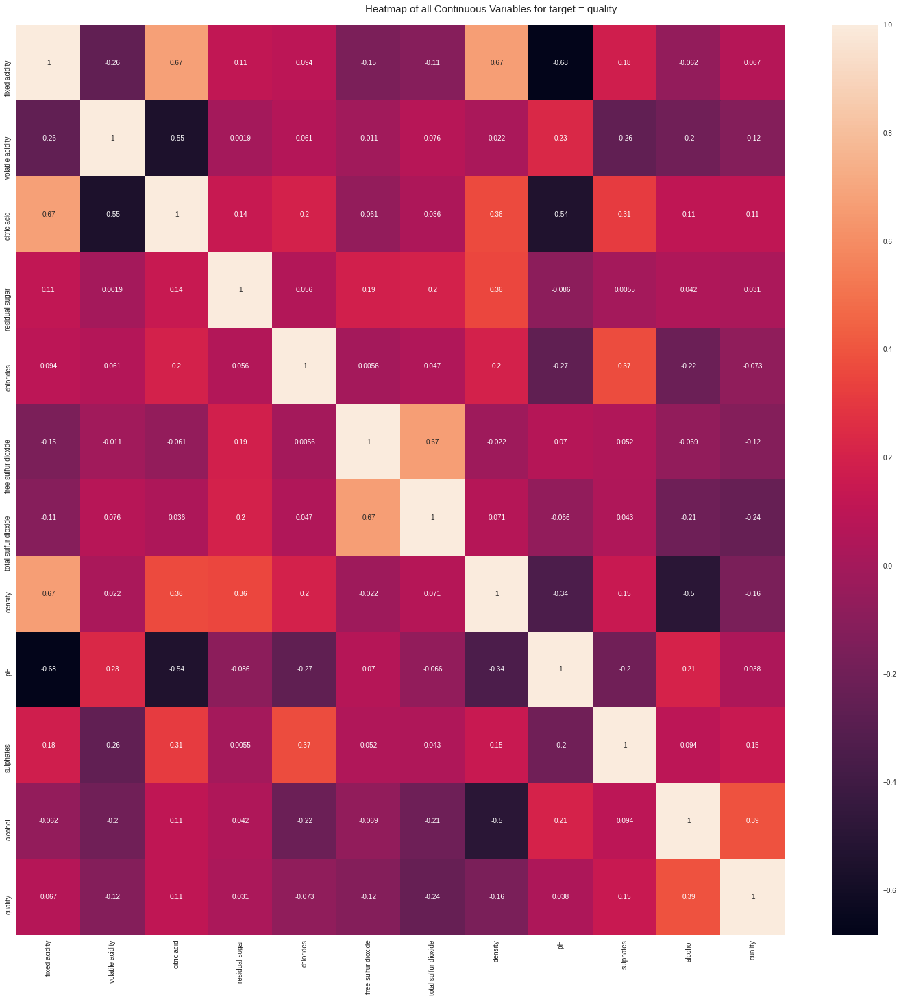

No categorical or boolean vars in data set. Hence no pivot plots...
No categorical or numeric vars in data set. Hence no bar charts.
Time to run AutoViz (in seconds) = 35.215

 ###################### VISUALIZATION Completed ########################


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,0
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,0
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,1
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,0
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,1
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,1
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,0


In [ ]:
AV.AutoViz(filename="", sep=',', depVar='quality', dfte=wine_df, header=0, verbose=0,
                            lowess=True)

In [ ]:
pandas_profiling.ProfileReport(wine_df,minimal=True)

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
corr=wine_df.corr()
corr

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,-0.256131,0.671703,0.114777,0.093705,-0.153794,-0.113181,0.668047,-0.682978,0.183006,-0.061668,0.124052
volatile acidity,-0.256131,1.000000,-0.552496,0.001918,0.061298,-0.010504,0.076470,0.022026,0.234937,-0.260987,-0.202288,-0.390558
citric acid,0.671703,-0.552496,1.000000,0.143577,0.203823,-0.060978,0.035533,0.364947,-0.541904,0.312770,0.109903,0.226373
residual sugar,0.114777,0.001918,0.143577,1.000000,0.055610,0.187049,0.203028,0.355283,-0.085652,0.005527,0.042075,0.013732
chlorides,0.093705,0.061298,0.203823,0.055610,1.000000,0.005562,0.047400,0.200632,-0.265026,0.371260,-0.221141,-0.128907
free sulfur dioxide,-0.153794,-0.010504,-0.060978,0.187049,0.005562,1.000000,0.667666,-0.021946,0.070377,0.051658,-0.069408,-0.050656
total sulfur dioxide,-0.113181,0.076470,0.035533,0.203028,0.047400,0.667666,1.000000,0.071269,-0.066495,0.042947,-0.205654,-0.185100
density,0.668047,0.022026,0.364947,0.355283,0.200632,-0.021946,0.071269,1.000000,-0.341699,0.148506,-0.496180,-0.174919
pH,-0.682978,0.234937,-0.541904,-0.085652,-0.265026,0.070377,-0.066495,-0.341699,1.000000,-0.196648,0.205633,-0.057731
sulphates,0.183006,-0.260987,0.312770,0.005527,0.371260,0.051658,0.042947,0.148506,-0.196648,1.000000,0.093595,0.251397


AttributeError: ignored

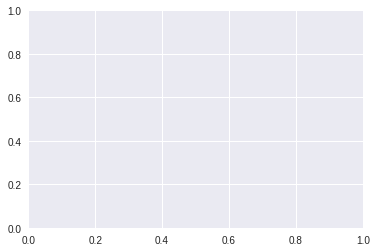

In [ ]:
sns.heatmap(corr,annot=True,cmasp="rainbow")

In [ ]:
wine_df.drop_duplicates(keep="first",inplace=True,ignore_index=True)

In [ ]:
wine_df.shape

(1359, 12)

In [ ]:
data=wine_df.dropna(subset=['quality'],axis=0,how='any')

## Transform quality feature into binary (Good or Bad)

In [ ]:
wine_df.quality = np.where(wine_df.quality >= 6,'Good', 'Bad')

In [ ]:
wine_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,Bad
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,Bad
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,Bad
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,Good
4,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,Bad


## Compare Model with Default Setup

In [ ]:
from pycaret.classification import *

In [ ]:
exp_clf101 = setup(data = wine_df, target = 'quality', session_id=123)

,Description,Value
0,session_id,123
1,Target,quality
2,Target Type,Binary
3,Label Encoded,"Bad: 0, Good: 1"
4,Original Data,"(1359, 12)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
compare_models(include=['lr', 'knn', 'nb', 'dt', 'svm', 'rbfsvm','rf'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.7486,0.8164,0.7373,0.7764,0.7560,0.4971,0.4982,0.556
lr,Logistic Regression,0.7434,0.8125,0.7376,0.7693,0.7522,0.4864,0.4882,0.175
nb,Naive Bayes,0.7171,0.7805,0.6919,0.7550,0.7209,0.4353,0.4383,0.017
dt,Decision Tree Classifier,0.6730,0.6732,0.6723,0.6978,0.6835,0.3458,0.3471,0.020
rbfsvm,SVM - Radial Kernel,0.6393,0.6867,0.6682,0.6581,0.6613,0.2757,0.2776,0.158
knn,K Neighbors Classifier,0.5920,0.6238,0.5984,0.6183,0.6072,0.1827,0.1834,0.116
svm,SVM - Linear Kernel,0.5721,0.0000,0.5533,0.5652,0.4837,0.1463,0.2010,0.018


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)

In [ ]:
best = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.7518,0.8203,0.7573,0.7697,0.7629,0.5024,0.5032,0.495
rf,Random Forest Classifier,0.7486,0.8164,0.7373,0.7764,0.7560,0.4971,0.4982,0.564
lr,Logistic Regression,0.7434,0.8125,0.7376,0.7693,0.7522,0.4864,0.4882,0.444
ridge,Ridge Classifier,0.7413,0.0000,0.7296,0.7710,0.7487,0.4825,0.4845,0.014
lda,Linear Discriminant Analysis,0.7350,0.8113,0.7197,0.7665,0.7413,0.4702,0.4725,0.017
gbc,Gradient Boosting Classifier,0.7339,0.8097,0.7295,0.7598,0.7437,0.4672,0.4685,0.193
ada,Ada Boost Classifier,0.7276,0.7904,0.7336,0.7485,0.7395,0.4541,0.4560,0.123
lightgbm,Light Gradient Boosting Machine,0.7276,0.8028,0.7296,0.7520,0.7393,0.4541,0.4562,0.120
nb,Naive Bayes,0.7171,0.7805,0.6919,0.7550,0.7209,0.4353,0.4383,0.016
qda,Quadratic Discriminant Analysis,0.6939,0.7691,0.7077,0.7130,0.7093,0.3862,0.3876,0.017


## Compare Models with Tuned Setup

In [ ]:
exp_clf102 = setup(data = wine_df, target = 'quality', session_id=123,
                  normalize = True, 
                  transformation = True)

,Description,Value
0,session_id,123
1,Target,quality
2,Target Type,Binary
3,Label Encoded,"Bad: 0, Good: 1"
4,Original Data,"(1359, 12)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
best = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.7518,0.8193,0.7594,0.7690,0.7636,0.5023,0.5032,0.507
rf,Random Forest Classifier,0.7455,0.8159,0.7373,0.7719,0.7536,0.4906,0.4919,0.567
ridge,Ridge Classifier,0.7434,0.0000,0.7456,0.7659,0.7539,0.4860,0.4884,0.016
lda,Linear Discriminant Analysis,0.7434,0.8169,0.7456,0.7659,0.7539,0.4860,0.4884,0.017
lr,Logistic Regression,0.7392,0.8156,0.7535,0.7552,0.7531,0.4767,0.4785,0.398
lightgbm,Light Gradient Boosting Machine,0.7360,0.8068,0.7375,0.7582,0.7472,0.4711,0.4721,0.130
gbc,Gradient Boosting Classifier,0.7339,0.8095,0.7295,0.7600,0.7437,0.4671,0.4686,0.201
nb,Naive Bayes,0.7297,0.8018,0.7017,0.7696,0.7326,0.4605,0.4643,0.016
ada,Ada Boost Classifier,0.7265,0.7895,0.7316,0.7478,0.7382,0.4520,0.4539,0.130
qda,Quadratic Discriminant Analysis,0.7213,0.7902,0.7176,0.7477,0.7313,0.4421,0.4440,0.018


In [ ]:
compare_models(include=['lr', 'knn', 'nb', 'dt', 'svm', 'rbfsvm','rf'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rbfsvm,SVM - Radial Kernel,0.7476,0.8144,0.7495,0.7701,0.7584,0.4942,0.4961,0.120
rf,Random Forest Classifier,0.7455,0.8159,0.7373,0.7719,0.7536,0.4906,0.4919,0.568
lr,Logistic Regression,0.7392,0.8156,0.7535,0.7552,0.7531,0.4767,0.4785,0.028
nb,Naive Bayes,0.7297,0.8018,0.7017,0.7696,0.7326,0.4605,0.4643,0.017
knn,K Neighbors Classifier,0.7024,0.7598,0.7494,0.7071,0.7272,0.4005,0.4019,0.118
dt,Decision Tree Classifier,0.6740,0.6744,0.6703,0.7000,0.6835,0.3481,0.3496,0.020
svm,SVM - Linear Kernel,0.6667,0.0000,0.6719,0.6927,0.6761,0.3326,0.3376,0.018


SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
    max_iter=-1, probability=True, random_state=123, shrinking=True, tol=0.001,
    verbose=False)

## Build Extra Tree Classifier

In [ ]:
rf_model = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7917,0.8610,0.7451,0.8444,0.7917,0.5850,0.5895
1,0.8105,0.8940,0.8000,0.8333,0.8163,0.6208,0.6214
2,0.7579,0.8349,0.7400,0.7872,0.7629,0.5161,0.5171
3,0.7158,0.8193,0.6800,0.7556,0.7158,0.4331,0.4356
4,0.6947,0.7247,0.7200,0.7059,0.7129,0.3871,0.3872
5,0.7263,0.7651,0.6800,0.7727,0.7234,0.4547,0.4584
6,0.7368,0.8160,0.7600,0.7451,0.7525,0.4716,0.4717
7,0.6632,0.7580,0.6600,0.6875,0.6735,0.3259,0.3262
8,0.8211,0.8694,0.8431,0.8269,0.8350,0.6396,0.6397
9,0.7368,0.8171,0.7451,0.7600,0.7525,0.4716,0.4717


In [ ]:
rbfsvm_model = create_model('rbfsvm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8229,0.8697,0.7843,0.8696,0.8247,0.6468,0.6503
1,0.8105,0.8933,0.8600,0.7963,0.8269,0.6183,0.6205
2,0.7579,0.8213,0.7200,0.8000,0.7579,0.5171,0.5200
3,0.7579,0.8151,0.8000,0.7547,0.7767,0.5128,0.5139
4,0.6737,0.7196,0.7400,0.6727,0.7048,0.3419,0.3438
5,0.7158,0.7827,0.6800,0.7556,0.7158,0.4331,0.4356
6,0.7368,0.8067,0.7200,0.7660,0.7423,0.4740,0.4749
7,0.6842,0.7573,0.7200,0.6923,0.7059,0.3653,0.3656
8,0.7895,0.8556,0.7843,0.8163,0.8000,0.5780,0.5785
9,0.7263,0.8231,0.6863,0.7778,0.7292,0.4547,0.4584


## Evaluate Model

In [ ]:
evaluate_model(rf_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
evaluate_model(rbfsvm_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

## Predict Test Set 

In [ ]:
predict_model(rbfsvm_model)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,SVM - Radial Kernel,0.7794,0.849,0.7639,0.8088,0.7857,0.5588,0.5598


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Label,Score
0,-0.294949,-1.039406,1.564656,0.601796,-0.289226,0.883778,0.231702,-0.078746,0.506651,0.996631,0.789085,Good,Good,0.8653
1,-0.151314,1.482418,0.159114,1.639807,0.240044,0.735008,0.821732,-0.152690,-0.933201,-0.865235,-1.081358,Bad,Bad,0.7131
2,0.708967,-0.113106,0.502814,-1.197050,0.145148,-1.711594,-1.321515,0.165259,-0.201037,0.953869,0.640097,Good,Good,0.7160
3,-0.445266,-0.113106,0.056539,-0.206740,-0.411971,0.057081,-0.653133,-1.478474,0.316167,0.087222,1.346024,Good,Good,0.9505
4,-1.668667,-1.183452,0.309078,2.506225,-1.699405,-1.145709,1.649794,-0.520818,-0.005330,-0.544942,1.055851,Bad,Good,0.6721
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
403,-0.294949,0.176594,-0.717401,0.474172,0.768296,0.953255,0.868090,0.608687,0.569801,-0.076721,-1.081358,Bad,Bad,0.7564
404,-1.382707,-0.759497,-1.013276,-1.197050,-0.744559,-1.711594,-0.942894,-0.688298,0.252300,-0.347736,-1.081358,Bad,Bad,0.7281
405,1.177233,0.690296,-0.101495,0.816634,0.991233,1.262388,0.531473,1.661841,-0.398647,0.374330,-0.374285,Bad,Bad,0.5242
406,1.253726,-0.053191,0.918177,0.601796,1.297399,1.523963,0.912838,0.197198,-0.464895,0.667051,0.640097,Good,Good,0.7560


In [ ]:
predict_model(rf_model)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.7745,0.8504,0.7778,0.7925,0.785,0.548,0.5481


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Label,Score
0,-0.294949,-1.039406,1.564656,0.601796,-0.289226,0.883778,0.231702,-0.078746,0.506651,0.996631,0.789085,Good,Good,0.84
1,-0.151314,1.482418,0.159114,1.639807,0.240044,0.735008,0.821732,-0.152690,-0.933201,-0.865235,-1.081358,Bad,Bad,0.84
2,0.708967,-0.113106,0.502814,-1.197050,0.145148,-1.711594,-1.321515,0.165259,-0.201037,0.953869,0.640097,Good,Good,0.73
3,-0.445266,-0.113106,0.056539,-0.206740,-0.411971,0.057081,-0.653133,-1.478474,0.316167,0.087222,1.346024,Good,Good,0.97
4,-1.668667,-1.183452,0.309078,2.506225,-1.699405,-1.145709,1.649794,-0.520818,-0.005330,-0.544942,1.055851,Bad,Good,0.66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
403,-0.294949,0.176594,-0.717401,0.474172,0.768296,0.953255,0.868090,0.608687,0.569801,-0.076721,-1.081358,Bad,Bad,0.65
404,-1.382707,-0.759497,-1.013276,-1.197050,-0.744559,-1.711594,-0.942894,-0.688298,0.252300,-0.347736,-1.081358,Bad,Bad,0.68
405,1.177233,0.690296,-0.101495,0.816634,0.991233,1.262388,0.531473,1.661841,-0.398647,0.374330,-0.374285,Bad,Bad,0.62
406,1.253726,-0.053191,0.918177,0.601796,1.297399,1.523963,0.912838,0.197198,-0.464895,0.667051,0.640097,Good,Good,0.67


## Save Model

In [ ]:
save_model(rf_model, model_name = 'rf_model')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[], target='quality',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_stra...
                  RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                         class_weight=None, criterion='gini',
                                         max_depth=None, max_features='auto',
                                         max_l

In [ ]:
!pip install pycaret --q

In [ ]:
pip install --upgrade streamlit -q

     |████████████████████████████████| 8.0 MB 2.7 MB/s 
     |████████████████████████████████| 75 kB 3.4 MB/s 
     |████████████████████████████████| 111 kB 31.2 MB/s 
     |████████████████████████████████| 4.3 MB 61.5 MB/s 
     |████████████████████████████████| 123 kB 69.8 MB/s 
     |████████████████████████████████| 787 kB 46.0 MB/s 
     |████████████████████████████████| 370 kB 69.8 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jupyter-console 5.2.0 requires prompt-toolkit<2.0.0,>=1.0.0, but you have prompt-toolkit 3.0.20 which is incompatible.
google-colab 1.0.0 requires ipykernel~=4.10, but you have ipykernel 6.3.1 which is incompatible.
google-colab 1.0.0 requires ipython~=5.5.0, but you have ipython 7.27.0 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.


In [ ]:
!pip install ipykernel==4.10

     |████████████████████████████████| 109 kB 3.3 MB/s 
  Attempting uninstall: ipykernel
    Found existing installation: ipykernel 6.3.1
    Uninstalling ipykernel-6.3.1:
      Successfully uninstalled ipykernel-6.3.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pydeck 0.7.0 requires ipykernel>=5.1.2; python_version >= "3.4", but you have ipykernel 4.10.0 which is incompatible.
jupyter-console 5.2.0 requires prompt-toolkit<2.0.0,>=1.0.0, but you have prompt-toolkit 3.0.20 which is incompatible.
google-colab 1.0.0 requires ipython~=5.5.0, but you have ipython 7.27.0 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.


In [ ]:
import streamlit

In [ ]:
!pip install pyngrok -q 

     |████████████████████████████████| 745 kB 3.2 MB/s 
